In [69]:
import pandas as pd
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet
from statsmodels.tools.eval_measures import rmse
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.serialize import model_to_json, model_from_json

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

df = pd.read_csv('D:\Download( Chrome)\ELEC0088_Assignment-main\LSTM/london_weather.csv')
# print(df.info())
df.drop(columns = ['snow_depth'], inplace = True)
df.dropna(inplace= True)
# df.reset_index(drop=True, inplace=True)
# print(df.info())

In [70]:
# print(df.tail())
df = df.rename(columns={'mean_temp': 'y', 'date':'ds'})
df['ds'] = pd.to_datetime(df['ds'], format='%Y%m%d')
# print(df.tail())

In [71]:
df.sort_values(by='ds', inplace = True)
df.reset_index(drop=True, inplace=True)
# print(df.head())
# print(df.tail())

15261


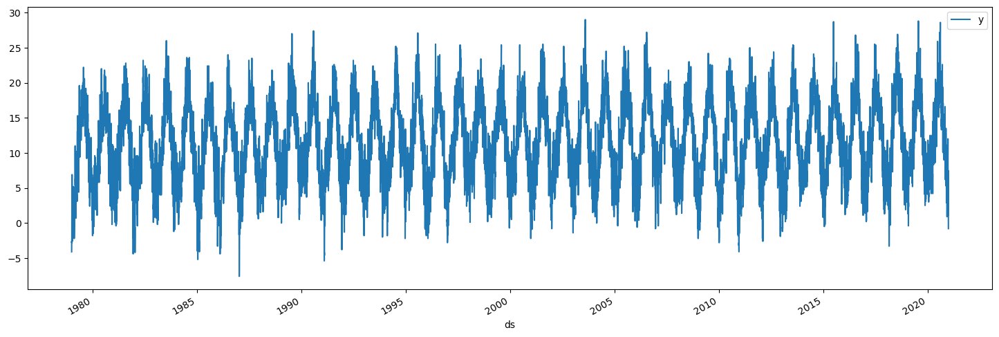

In [72]:
df.plot(x='ds',y='y',figsize=(18,6))
print(len(df))

In [42]:
Test_split = round(len(df)*0.2)
train = df.iloc[:len(df)-Test_split]
test = df.iloc[len(df)-Test_split:]

print(len(train))
print(len(test))

print(test.tail())

12209
3052
              ds  cloud_cover  sunshine  global_radiation  max_temp    y  \
15256 2020-12-27          1.0       0.9              32.0       7.5  7.5   
15257 2020-12-28          7.0       3.7              38.0       3.6  1.1   
15258 2020-12-29          7.0       0.0              21.0       4.1  2.6   
15259 2020-12-30          6.0       0.4              22.0       5.6  2.7   
15260 2020-12-31          7.0       1.3              34.0       1.5 -0.8   

       min_temp  precipitation  pressure  
15256       7.6            2.0   98000.0  
15257      -1.3            0.2   97370.0  
15258       1.1            0.0   98830.0  
15259      -0.1            0.0  100200.0  
15260      -3.1            0.0  100500.0  


In [43]:
def extra_regressor_forecast (multi_var,periods):
    t = train[['ds',multi_var]]
    t = t.rename(columns={multi_var: 'y', 'date':'ds'})
    model = Prophet()
    model.fit(t)
    future = model.make_future_dataframe(periods=periods)
    forecast = model.predict(future)
    return forecast['yhat']

def cross_valid_check(train, df_p):
    best_feature = None
    lowest = df_p.iloc[-1]['mape']
    for column in train.loc[:, ~train.columns.isin(['ds', 'y'])].columns:
        m_cross_valid = Prophet()
        m_cross_valid.add_regressor(column)
        m_cross_valid.fit(train)
        print('Cross validating model with dataset: '+ column)
        
        df_cv_cross_valid = cross_validation(m_cross_valid, initial='10000 days', period='180 days', horizon = '365 days')
        df_p_cross_valid = performance_metrics(df_cv_cross_valid)
        if df_p_cross_valid.iloc[-1]['mape'] < lowest:
            print(lowest ,df_p_cross_valid.iloc[-1]['mape'])
            lowest = df_p_cross_valid.iloc[-1]['mape']
            print(column+' is better')
            best_feature = column
    print('\n')
    return best_feature

05:43:08 - cmdstanpy - INFO - Chain [1] start processing
05:43:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/11 [00:00<?, ?it/s]

05:43:12 - cmdstanpy - INFO - Chain [1] start processing
05:43:15 - cmdstanpy - INFO - Chain [1] done processing
05:43:16 - cmdstanpy - INFO - Chain [1] start processing
05:43:19 - cmdstanpy - INFO - Chain [1] done processing
05:43:20 - cmdstanpy - INFO - Chain [1] start processing
05:43:22 - cmdstanpy - INFO - Chain [1] done processing
05:43:23 - cmdstanpy - INFO - Chain [1] start processing
05:43:26 - cmdstanpy - INFO - Chain [1] done processing
05:43:27 - cmdstanpy - INFO - Chain [1] start processing
05:43:30 - cmdstanpy - INFO - Chain [1] done processing
05:43:31 - cmdstanpy - INFO - Chain [1] start processing
05:43:35 - cmdstanpy - INFO - Chain [1] done processing
05:43:36 - cmdstanpy - INFO - Chain [1] start processing
05:43:39 - cmdstanpy - INFO - Chain [1] done processing
05:43:40 - cmdstanpy - INFO - Chain [1] start processing
05:43:43 - cmdstanpy - INFO - Chain [1] done processing
05:43:44 - cmdstanpy - INFO - Chain [1] start processing
05:43:47 - cmdstanpy - INFO - Chain [1]

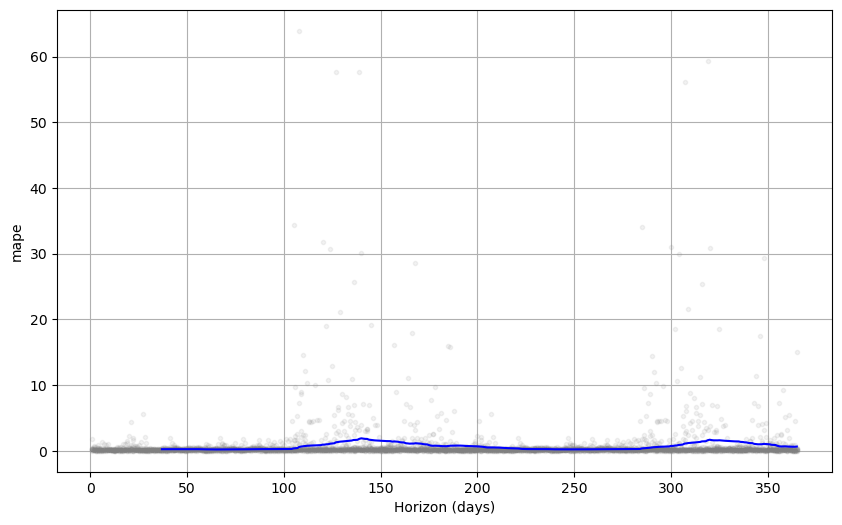

In [7]:
m = Prophet()
m.fit(train)
df_cv = cross_validation(m, initial='10000 days', period='180 days', horizon = '365 days')
df_p = performance_metrics(df_cv)
fig = plot_cross_validation_metric(df_cv, metric='mape')

In [8]:
best_feature = cross_valid_check(train, df_p)

05:44:00 - cmdstanpy - INFO - Chain [1] start processing
05:44:04 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: cloud_cover


  0%|          | 0/11 [00:00<?, ?it/s]

05:44:05 - cmdstanpy - INFO - Chain [1] start processing
05:44:07 - cmdstanpy - INFO - Chain [1] done processing
05:44:08 - cmdstanpy - INFO - Chain [1] start processing
05:44:11 - cmdstanpy - INFO - Chain [1] done processing
05:44:12 - cmdstanpy - INFO - Chain [1] start processing
05:44:15 - cmdstanpy - INFO - Chain [1] done processing
05:44:17 - cmdstanpy - INFO - Chain [1] start processing
05:44:20 - cmdstanpy - INFO - Chain [1] done processing
05:44:21 - cmdstanpy - INFO - Chain [1] start processing
05:44:24 - cmdstanpy - INFO - Chain [1] done processing
05:44:26 - cmdstanpy - INFO - Chain [1] start processing
05:44:31 - cmdstanpy - INFO - Chain [1] done processing
05:44:33 - cmdstanpy - INFO - Chain [1] start processing
05:44:36 - cmdstanpy - INFO - Chain [1] done processing
05:44:37 - cmdstanpy - INFO - Chain [1] start processing
05:44:40 - cmdstanpy - INFO - Chain [1] done processing
05:44:42 - cmdstanpy - INFO - Chain [1] start processing
05:44:44 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: sunshine


  0%|          | 0/11 [00:00<?, ?it/s]

05:45:02 - cmdstanpy - INFO - Chain [1] start processing
05:45:05 - cmdstanpy - INFO - Chain [1] done processing
05:45:06 - cmdstanpy - INFO - Chain [1] start processing
05:45:08 - cmdstanpy - INFO - Chain [1] done processing
05:45:10 - cmdstanpy - INFO - Chain [1] start processing
05:45:13 - cmdstanpy - INFO - Chain [1] done processing
05:45:15 - cmdstanpy - INFO - Chain [1] start processing
05:45:17 - cmdstanpy - INFO - Chain [1] done processing
05:45:18 - cmdstanpy - INFO - Chain [1] start processing
05:45:22 - cmdstanpy - INFO - Chain [1] done processing
05:45:23 - cmdstanpy - INFO - Chain [1] start processing
05:45:27 - cmdstanpy - INFO - Chain [1] done processing
05:45:28 - cmdstanpy - INFO - Chain [1] start processing
05:45:32 - cmdstanpy - INFO - Chain [1] done processing
05:45:33 - cmdstanpy - INFO - Chain [1] start processing
05:45:36 - cmdstanpy - INFO - Chain [1] done processing
05:45:37 - cmdstanpy - INFO - Chain [1] start processing
05:45:40 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: global_radiation


  0%|          | 0/11 [00:00<?, ?it/s]

05:45:56 - cmdstanpy - INFO - Chain [1] start processing
05:45:59 - cmdstanpy - INFO - Chain [1] done processing
05:46:01 - cmdstanpy - INFO - Chain [1] start processing
05:46:05 - cmdstanpy - INFO - Chain [1] done processing
05:46:06 - cmdstanpy - INFO - Chain [1] start processing
05:46:11 - cmdstanpy - INFO - Chain [1] done processing
05:46:12 - cmdstanpy - INFO - Chain [1] start processing
05:46:15 - cmdstanpy - INFO - Chain [1] done processing
05:46:16 - cmdstanpy - INFO - Chain [1] start processing
05:46:19 - cmdstanpy - INFO - Chain [1] done processing
05:46:20 - cmdstanpy - INFO - Chain [1] start processing
05:46:24 - cmdstanpy - INFO - Chain [1] done processing
05:46:26 - cmdstanpy - INFO - Chain [1] start processing
05:46:29 - cmdstanpy - INFO - Chain [1] done processing
05:46:30 - cmdstanpy - INFO - Chain [1] start processing
05:46:33 - cmdstanpy - INFO - Chain [1] done processing
05:46:34 - cmdstanpy - INFO - Chain [1] start processing
05:46:37 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: max_temp


  0%|          | 0/11 [00:00<?, ?it/s]

05:46:54 - cmdstanpy - INFO - Chain [1] start processing
05:46:57 - cmdstanpy - INFO - Chain [1] done processing
05:46:58 - cmdstanpy - INFO - Chain [1] start processing
05:47:01 - cmdstanpy - INFO - Chain [1] done processing
05:47:02 - cmdstanpy - INFO - Chain [1] start processing
05:47:07 - cmdstanpy - INFO - Chain [1] done processing
05:47:08 - cmdstanpy - INFO - Chain [1] start processing
05:47:12 - cmdstanpy - INFO - Chain [1] done processing
05:47:13 - cmdstanpy - INFO - Chain [1] start processing
05:47:17 - cmdstanpy - INFO - Chain [1] done processing
05:47:18 - cmdstanpy - INFO - Chain [1] start processing
05:47:21 - cmdstanpy - INFO - Chain [1] done processing
05:47:22 - cmdstanpy - INFO - Chain [1] start processing
05:47:27 - cmdstanpy - INFO - Chain [1] done processing
05:47:29 - cmdstanpy - INFO - Chain [1] start processing
05:47:32 - cmdstanpy - INFO - Chain [1] done processing
05:47:33 - cmdstanpy - INFO - Chain [1] start processing
05:47:37 - cmdstanpy - INFO - Chain [1]

0.6360439012387851 0.35867543273416264
max_temp is better


05:47:49 - cmdstanpy - INFO - Chain [1] start processing
05:47:55 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: min_temp


  0%|          | 0/11 [00:00<?, ?it/s]

05:47:56 - cmdstanpy - INFO - Chain [1] start processing
05:48:02 - cmdstanpy - INFO - Chain [1] done processing
05:48:03 - cmdstanpy - INFO - Chain [1] start processing
05:48:05 - cmdstanpy - INFO - Chain [1] done processing
05:48:06 - cmdstanpy - INFO - Chain [1] start processing
05:48:11 - cmdstanpy - INFO - Chain [1] done processing
05:48:12 - cmdstanpy - INFO - Chain [1] start processing
05:48:16 - cmdstanpy - INFO - Chain [1] done processing
05:48:17 - cmdstanpy - INFO - Chain [1] start processing
05:48:21 - cmdstanpy - INFO - Chain [1] done processing
05:48:22 - cmdstanpy - INFO - Chain [1] start processing
05:48:27 - cmdstanpy - INFO - Chain [1] done processing
05:48:28 - cmdstanpy - INFO - Chain [1] start processing
05:48:33 - cmdstanpy - INFO - Chain [1] done processing
05:48:34 - cmdstanpy - INFO - Chain [1] start processing
05:48:38 - cmdstanpy - INFO - Chain [1] done processing
05:48:40 - cmdstanpy - INFO - Chain [1] start processing
05:48:44 - cmdstanpy - INFO - Chain [1]

0.35867543273416264 0.21562968121928403
min_temp is better


05:48:58 - cmdstanpy - INFO - Chain [1] start processing
05:49:02 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: precipitation


  0%|          | 0/11 [00:00<?, ?it/s]

05:49:03 - cmdstanpy - INFO - Chain [1] start processing
05:49:06 - cmdstanpy - INFO - Chain [1] done processing
05:49:07 - cmdstanpy - INFO - Chain [1] start processing
05:49:09 - cmdstanpy - INFO - Chain [1] done processing
05:49:10 - cmdstanpy - INFO - Chain [1] start processing
05:49:14 - cmdstanpy - INFO - Chain [1] done processing
05:49:15 - cmdstanpy - INFO - Chain [1] start processing
05:49:17 - cmdstanpy - INFO - Chain [1] done processing
05:49:18 - cmdstanpy - INFO - Chain [1] start processing
05:49:22 - cmdstanpy - INFO - Chain [1] done processing
05:49:23 - cmdstanpy - INFO - Chain [1] start processing
05:49:26 - cmdstanpy - INFO - Chain [1] done processing
05:49:27 - cmdstanpy - INFO - Chain [1] start processing
05:49:30 - cmdstanpy - INFO - Chain [1] done processing
05:49:31 - cmdstanpy - INFO - Chain [1] start processing
05:49:33 - cmdstanpy - INFO - Chain [1] done processing
05:49:35 - cmdstanpy - INFO - Chain [1] start processing
05:49:38 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: pressure


  0%|          | 0/11 [00:00<?, ?it/s]

05:49:56 - cmdstanpy - INFO - Chain [1] start processing
05:49:59 - cmdstanpy - INFO - Chain [1] done processing
05:50:00 - cmdstanpy - INFO - Chain [1] start processing
05:50:04 - cmdstanpy - INFO - Chain [1] done processing
05:50:05 - cmdstanpy - INFO - Chain [1] start processing
05:50:08 - cmdstanpy - INFO - Chain [1] done processing
05:50:09 - cmdstanpy - INFO - Chain [1] start processing
05:50:14 - cmdstanpy - INFO - Chain [1] done processing
05:50:15 - cmdstanpy - INFO - Chain [1] start processing
05:50:18 - cmdstanpy - INFO - Chain [1] done processing
05:50:19 - cmdstanpy - INFO - Chain [1] start processing
05:50:23 - cmdstanpy - INFO - Chain [1] done processing
05:50:24 - cmdstanpy - INFO - Chain [1] start processing
05:50:26 - cmdstanpy - INFO - Chain [1] done processing
05:50:28 - cmdstanpy - INFO - Chain [1] start processing
05:50:31 - cmdstanpy - INFO - Chain [1] done processing
05:50:32 - cmdstanpy - INFO - Chain [1] start processing
05:50:35 - cmdstanpy - INFO - Chain [1]

In [44]:
periods = len(test)+17+365*5
m = Prophet()
m.add_regressor(str(best_feature))
print(best_feature +' added to the model')
m.fit(train)
future = m.make_future_dataframe(periods=periods)
future[best_feature] = extra_regressor_forecast(best_feature,periods)
print (best_feature+ ' predicted ')
forecast = m.predict(future)
print('Forecasting the mean temperature')

min_temp added to the model


06:03:46 - cmdstanpy - INFO - Chain [1] start processing
06:03:53 - cmdstanpy - INFO - Chain [1] done processing
06:03:54 - cmdstanpy - INFO - Chain [1] start processing
06:03:57 - cmdstanpy - INFO - Chain [1] done processing


min_temp predicted 
Forecasting the mean temperature


In [57]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
17098,2025-12-27,4.375158,1.427474,7.416665
17099,2025-12-28,4.410077,1.628590,7.462326
17100,2025-12-29,4.405234,1.480647,7.519918
17101,2025-12-30,4.361487,1.463936,7.473102
17102,2025-12-31,4.425763,1.369625,7.606136


In [66]:
plot_plotly(m ,forecast)

In [67]:
plot_components_plotly(m, forecast)

In [68]:
# m.plot(forecast).savefig('forecast.png');
# m.plot_components(forecast).savefig('components.png');

In [60]:
predictions = forecast.iloc[len(train):len(train)+len(test)]['yhat']
print("Root Mean Squared Error between actual and predicted values: ",rmse(predictions,test['y']))
print("Mean Value of Test Dataset:", test['y'].mean())

Root Mean Squared Error between actual and predicted values:  3.051630485000078
Mean Value of Test Dataset: 12.138859764089108


In [49]:
training = forecast.iloc[:len(train)]['yhat']
print("Root Mean Squared Error between actual and predicted values: ",rmse(training,train['y']))

Root Mean Squared Error between actual and predicted values:  2.8581793593074245


In [50]:
# with open('model_multi_prophet_weather_cross_validation_model.json', 'w') as fout:
#     fout.write(model_to_json(m))

In [51]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].to_csv('Prophet weather forecast2.csv')